# Data Generation for the Rummy Pool

In [1]:
import random
import string
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl



number_of_players_in_pool = int(input('How many players do you want to have in the pool: '))
bet_multiplier_options = [0.05, 0.1, 0.25, 0.5, 1, 2, 3, 5, 10, 20, 40, 80, 125, 200]
min_amount = [4, 8, 20, 40, 80, 160, 240, 400, 800, 1600, 3200, 6400, 10000, 16000]
bet_min = dict(zip(bet_multiplier_options, min_amount))
print(bet_min)

bet_multiplier_input = float(input("How much do you want the bet amount multiplier to be?\nChoose from the options - (0.05, 0.1, 0.25, 0.5, 1, 2, 3, 5, 10, 20, 40, 80, 125, 200): "))
print(f"You have chosen the bet amount multiplier to be: {bet_multiplier_input}")

for key in bet_min.keys():
    if key == bet_multiplier_input:
        min_amt_required = float(bet_min[key])
        print("Minimum amount is:", min_amt_required)
        print(type(min_amt_required))
    else:
        continue
        print("Sorry, you have chosen a wrong bet amount multiplier, please try again by chosing one from the options mentioned here (0.05, 0.1, 0.25, 0.5, 1, 2, 3,5, 10, 20, 40, 80, 125, 200): ")

totalPlayers = {}
for i in range(number_of_players_in_pool):
    x = ''.join([random.choice(string.ascii_uppercase) for k in range(4)]).title()
    y = round(random.uniform(min_amt_required, (min_amt_required + 30)), 3)
    totalPlayers[x] = y

Sum = sum(totalPlayers.values())
print(f"The total amount involved in this pool is: {Sum}")
total_players_df = pd.DataFrame(totalPlayers.items(), columns=['Name', 'Balance in Rupees'])
print("The below table shows all the players in the pool along with their account balances.")
print(total_players_df)

total_amount_credited_to_app = 0
percentage_deduction = 15 / 100



matches_data = []

def matches():
    global total_amount_credited_to_app
    global matches_data

    eligible_players = {k: v for k, v in totalPlayers.items() if v >= min_amt_required}

    if len(eligible_players) < 2:
        print("Insufficient eligible players for a match.")
        return

    p1 = random.choice(list(eligible_players.items()))
    del eligible_players[p1[0]]
    p2 = random.choice(list(eligible_players.items()))

    match_data = {
        'Match Number':'',
        'Player 1': p1[0],
        'Player 2': p2[0],
        'Loser': '',
        'Winner': '',
        'Points Lost by Loser': '',
        'Amount Lost by Loser': '',
        'Amount Remaining for Loser': '',
        'Amount to be Credited to App': '',
        'Total Amount Earned by App': '',
        'Amount Won by Winner': '',
        'Amount Remaining for Winner': ''
    }
    
    match_data['Match Number'] = len(matches_data) + 1
    
    remaining_balances = totalPlayers.copy()
    for player, balance in remaining_balances.items():
        if player == match_data['Loser']:
            match_data[player] = totalPlayers[player] - (random.randint(2, 80) * bet_multiplier_input)
        elif player == match_data['Winner']:
            match_data[player] = totalPlayers[player] + (
                        totalPlayers[match_data['Loser']] * bet_multiplier_input * (100 - percentage_deduction) / 100)
        else:
            match_data[player] = balance
    
    for players, remaining_bal in totalPlayers.items():
        if players == match_data['Loser']:
            match_data[players] = amount_remaining_for_loser
        elif players == match_data['Winner']:
            match_data[players] == amount_remaining_for_winner
        else:
            match_data[players] == remaining_bal
    
    match_data['Loser'] = p1[0] if random.choice([p1, p2]) == p2 else p2[0]
    match_data['Winner'] = p1[0] if match_data['Loser'] == p2[0] else p2[0]

    points_lost = random.choice(range(2, 80))
    amount_deducted_from_loser = round(points_lost * bet_multiplier_input, 3)
    amount_remaining_for_loser = round(totalPlayers[match_data['Loser']] - amount_deducted_from_loser, 3)
    amount_credited_to_app = round(amount_deducted_from_loser * percentage_deduction, 3)
    total_amount_credited_to_app += amount_credited_to_app

    match_data['Points Lost by Loser'] = points_lost
    match_data['Amount Lost by Loser'] = amount_deducted_from_loser
    match_data['Amount Remaining for Loser'] = amount_remaining_for_loser
    match_data['Amount to be Credited to App'] = amount_credited_to_app
    match_data['Total Amount Earned by App'] = total_amount_credited_to_app

    amount_earnt_by_winner = round(amount_deducted_from_loser - amount_credited_to_app, 3)
    amount_remaining_for_winner = round(totalPlayers[match_data['Winner']] + amount_earnt_by_winner, 3)

    match_data['Amount Won by Winner'] = amount_earnt_by_winner
    match_data['Amount Remaining for Winner'] = amount_remaining_for_winner

    totalPlayers[match_data['Loser']] = amount_remaining_for_loser
    totalPlayers[match_data['Winner']] = amount_remaining_for_winner
    
    
    print(f"In this match we have : \n {p1} v/s {p2}")
    print(f'Where player 1 is : {p1}')
    print(f'and player 2 is : {p2}')
    
    print (f"The Winner is : {match_data['Winner']} ")
    print(f"And the loser is : {match_data['Loser']}  ")
    
    print(f"Points lost by loser - {match_data['Loser']}  is : \n {points_lost}")
    print(f"Amount lost by loser - {match_data['Loser']}  is : \n {amount_deducted_from_loser}")
    print (f"Amount remaining in the loser {match_data['Loser']}'s account is : \n {amount_remaining_for_loser}")
    (f"Amount won by winner {match_data['Winner']} is : \n {amount_earnt_by_winner}")
    print(f"Amount remaining in the winner {match_data['Winner']}'s account is : \n {amount_remaining_for_winner}")
    
    print(f"Amount to be credited to app is : \n {amount_credited_to_app}")
    print(f"Total amount earnt by app is : \n {total_amount_credited_to_app}")
    
    closing_balance_of_match = pd.DataFrame(totalPlayers.items(), columns=['Name', "Balance"])
    closing_balance_of_match.loc[closing_balance_of_match['Name'] == match_data['Loser'], 'Balance'] = amount_remaining_for_loser
    closing_balance_of_match.loc[closing_balance_of_match['Name'] == match_data['Winner'], 'Balance'] = amount_remaining_for_winner
    print(f"The closing balance of this match is \n {closing_balance_of_match}")

   
    matches_data.append(match_data)

counter = len(totalPlayers)
print(counter)
match = 0

while counter > 1:
    matches()
    match += 1
    print(f"Match {match} concluded")
    print("-" * 120)
    counter = sum(1 for amount in totalPlayers.values() if amount >= min_amt_required)

matches_df = pd.DataFrame(matches_data)



How many players do you want to have in the pool: 100
{0.05: 4, 0.1: 8, 0.25: 20, 0.5: 40, 1: 80, 2: 160, 3: 240, 5: 400, 10: 800, 20: 1600, 40: 3200, 80: 6400, 125: 10000, 200: 16000}
How much do you want the bet amount multiplier to be?
Choose from the options - (0.05, 0.1, 0.25, 0.5, 1, 2, 3, 5, 10, 20, 40, 80, 125, 200): .05
You have chosen the bet amount multiplier to be: 0.05
Minimum amount is: 4.0
<class 'float'>
The total amount involved in this pool is: 1854.865
The below table shows all the players in the pool along with their account balances.
    Name  Balance in Rupees
0   Xhop             19.527
1   Bqyu             11.095
2   Rlqi             12.747
3   Nxhj             30.822
4   Xgfu              6.586
..   ...                ...
95  Yatc             27.623
96  Vdna             21.565
97  Oyko             27.366
98  Jcba             12.067
99  Orhr             30.219

[100 rows x 2 columns]
100
In this match we have : 
 ('Fvxp', 23.653) v/s ('Bcth', 12.62)
Where player

In [2]:
list(totalPlayers.keys())

['Xhop',
 'Bqyu',
 'Rlqi',
 'Nxhj',
 'Xgfu',
 'Ifbf',
 'Scqu',
 'Imuo',
 'Zttd',
 'Unym',
 'Kwzf',
 'Pysd',
 'Lsmf',
 'Fudy',
 'Yzys',
 'Uqky',
 'Qcgd',
 'Tdqg',
 'Ckws',
 'Nxnn',
 'Cefj',
 'Jylf',
 'Ejtj',
 'Guub',
 'Opya',
 'Flzk',
 'Crla',
 'Akwu',
 'Gtyh',
 'Wncu',
 'Ihqz',
 'Yznb',
 'Xezp',
 'Ppgu',
 'Etfu',
 'Vziz',
 'Rzor',
 'Xbrh',
 'Zwue',
 'Zyco',
 'Tflb',
 'Adnr',
 'Hdys',
 'Nfpv',
 'Npwb',
 'Ivqs',
 'Uvpe',
 'Uxem',
 'Fzvj',
 'Mwpw',
 'Yocc',
 'Lrkh',
 'Hgjs',
 'Sifo',
 'Pupz',
 'Qmke',
 'Mviv',
 'Fqnv',
 'Jafa',
 'Tujn',
 'Vvvi',
 'Yylr',
 'Pvmp',
 'Tbhl',
 'Vcal',
 'Ahdu',
 'Oyyj',
 'Tezb',
 'Bcth',
 'Tvcj',
 'Btfj',
 'Fvxp',
 'Zekw',
 'Iiqi',
 'Caqs',
 'Wcgi',
 'Zsnn',
 'Mmyu',
 'Piez',
 'Oksh',
 'Npqv',
 'Bjkw',
 'Djjd',
 'Ovjb',
 'Dyiv',
 'Uask',
 'File',
 'Kxzn',
 'Svjd',
 'Kqgt',
 'Gpoo',
 'Ltlx',
 'Oecc',
 'Zksm',
 'Ibhy',
 'Yatc',
 'Vdna',
 'Oyko',
 'Jcba',
 'Orhr']

In [3]:
matches_df

,Match Number,Player 1,Player 2,Loser,Winner,Points Lost by Loser,Amount Lost by Loser,Amount Remaining for Loser,Amount to be Credited to App,Total Amount Earned by App,...,Gpoo,Ltlx,Oecc,Zksm,Ibhy,Yatc,Vdna,Oyko,Jcba,Orhr
0,1,Fvxp,Bcth,Bcth,Fvxp,4,0.20,12.420,0.030,0.030,...,14.688,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219
1,2,Xgfu,Yzys,Xgfu,Yzys,2,0.10,6.486,0.015,0.045,...,14.688,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219
2,3,Wncu,Xhop,Xhop,Wncu,76,3.80,15.727,0.570,0.615,...,14.688,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219
3,4,Wncu,Pvmp,Pvmp,Wncu,60,3.00,19.318,0.450,1.065,...,14.688,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219
4,5,Flzk,Lsmf,Lsmf,Flzk,22,1.10,26.390,0.165,1.230,...,14.688,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4909,4910,Nxhj,Ltlx,Ltlx,Nxhj,28,1.40,9.529,0.210,1486.084,...,2.634,10.929,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277
4910,4911,Nxhj,Ltlx,Nxhj,Ltlx,23,1.15,67.966,0.172,1486.256,...,2.634,9.529,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277
4911,4912,Ltlx,Nxhj,Ltlx,Nxhj,54,2.70,7.807,0.405,1486.661,...,2.634,10.507,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277
4912,4913,Nxhj,Ltlx,Ltlx,Nxhj,69,3.45,4.357,0.517,1487.178,...,2.634,7.807,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277


In [4]:
matches_df.to_excel('Rummy.xlsx', index=False, engine='openpyxl')

In [5]:
App = matches_df['Total Amount Earned by App']
col_names = matches_df.columns

### Visualization of player's and app's flow of balances

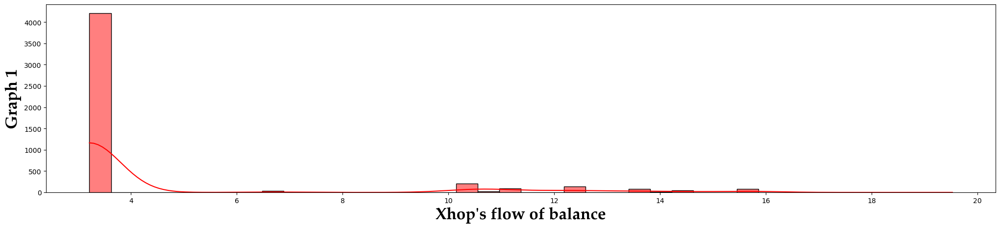

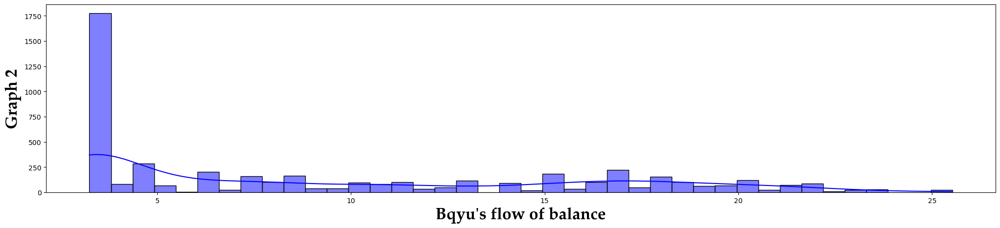

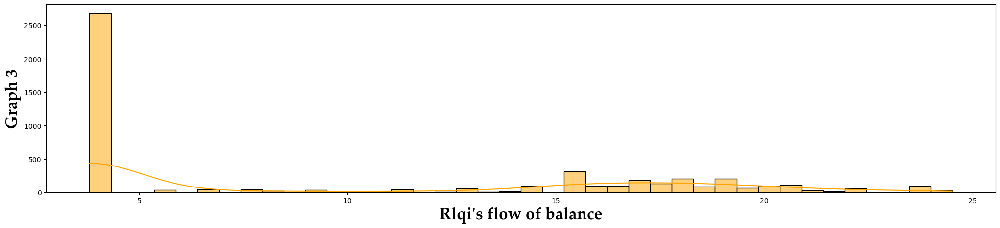

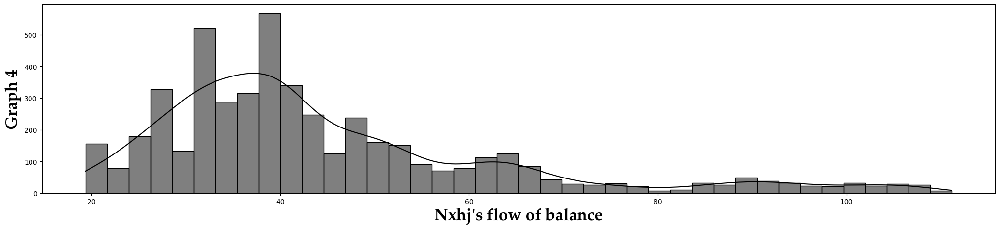

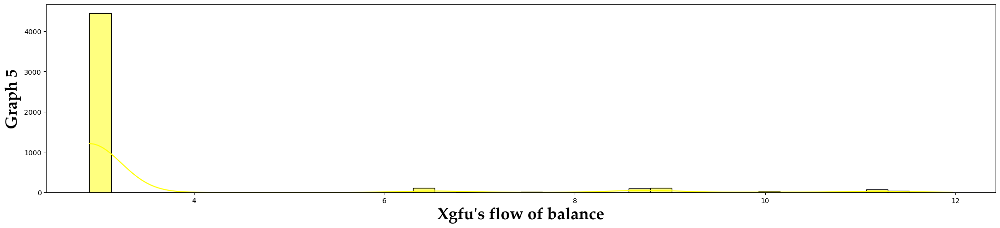

...

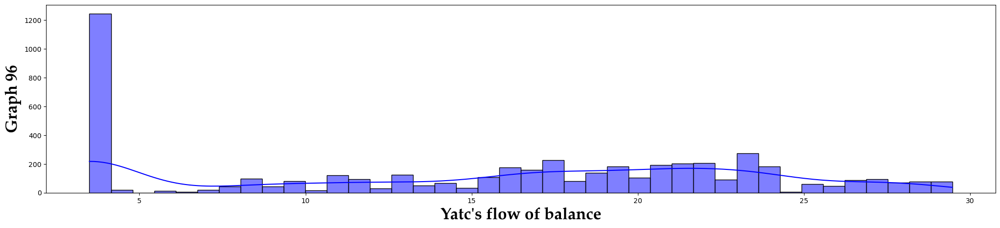

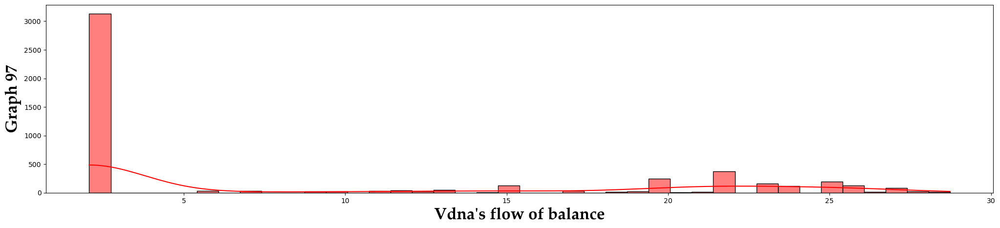

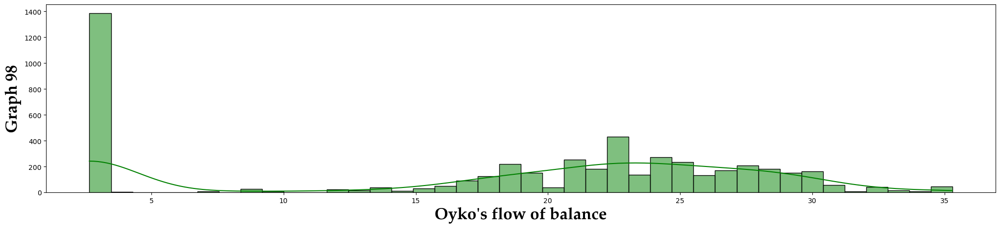

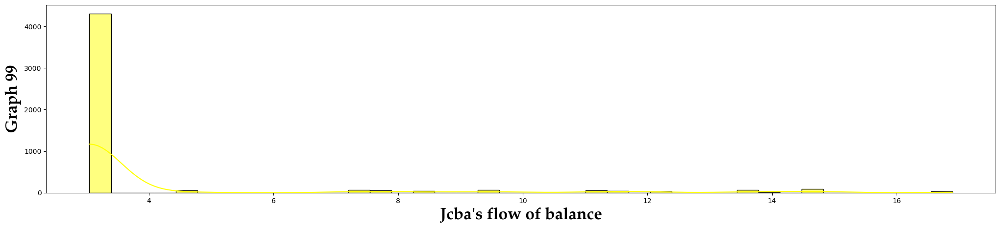

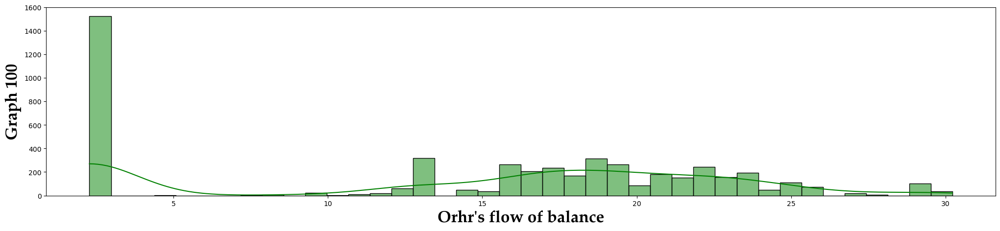

In [6]:
font = {'size':24, 'family':'Palatino Linotype', 'weight':'bold'}
for i in range(number_of_players_in_pool):
    plt.figure(figsize=(25,5))
    plott = sns.histplot(matches_df.iloc[:,12+i], kde=True, bins=40, color= random.choice(['r', 'g','b','yellow','black','orange']))
    plt.xlabel(f"{col_names[12+i]}'s flow of balance", fontdict=font)
    plt.ylabel(f"Graph {i+1}", fontdict=font)
    plt.show()
    i += 1

Text(0, 0.5, 'Count')

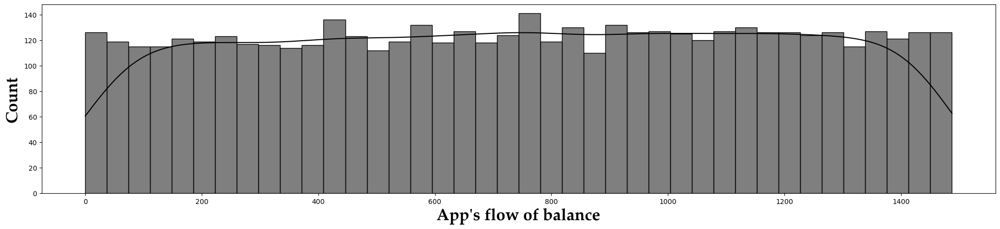

In [7]:
plt.figure(figsize=(25,5))
sns.histplot(matches_df.iloc[:,9], kde=True, bins=40, color='black')
plt.xlabel("App's flow of balance", fontdict=font)
plt.ylabel("Count", fontdict=font)

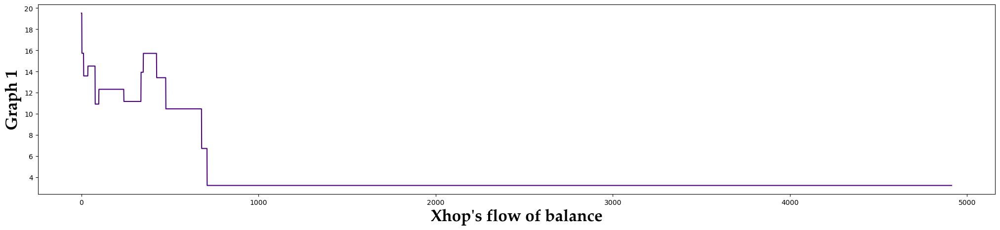

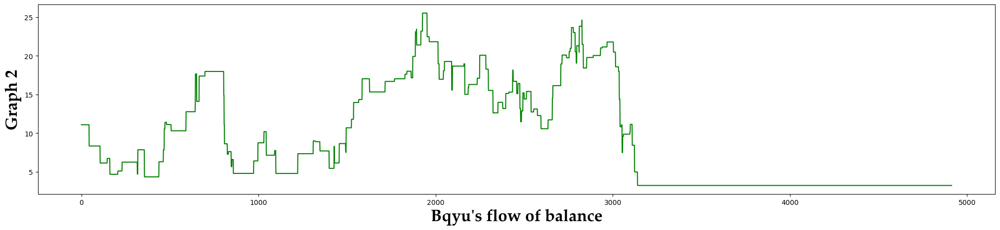

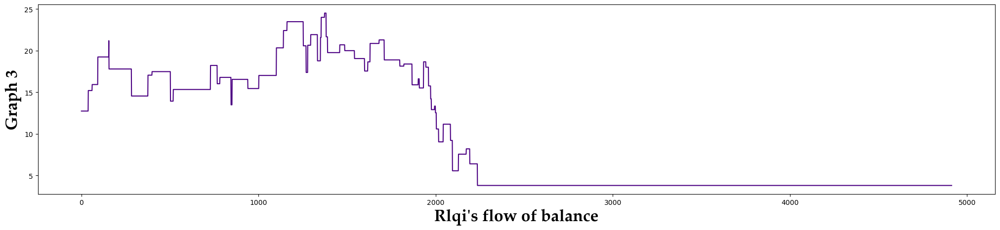

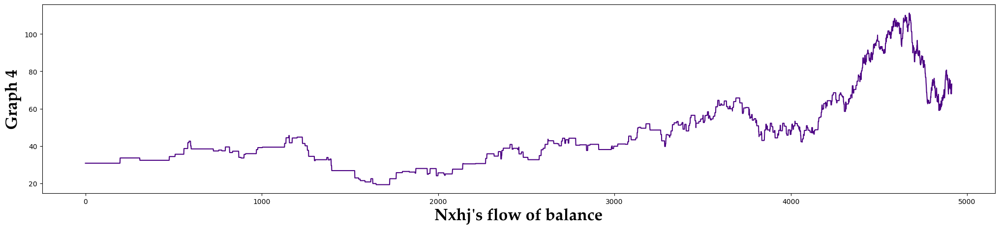

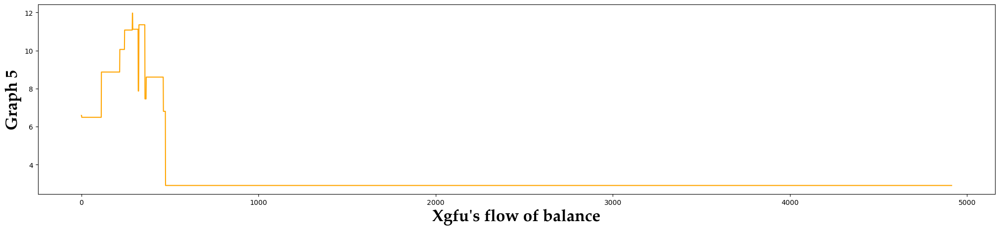

...

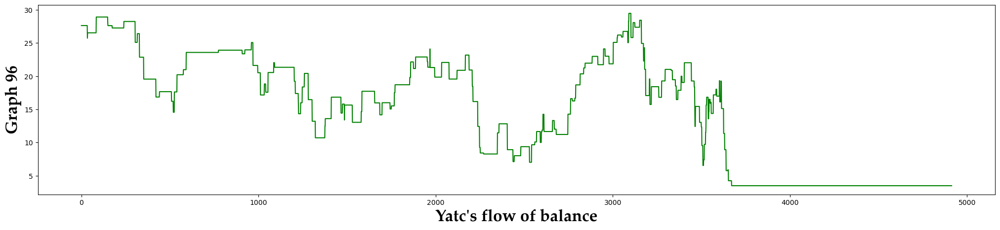

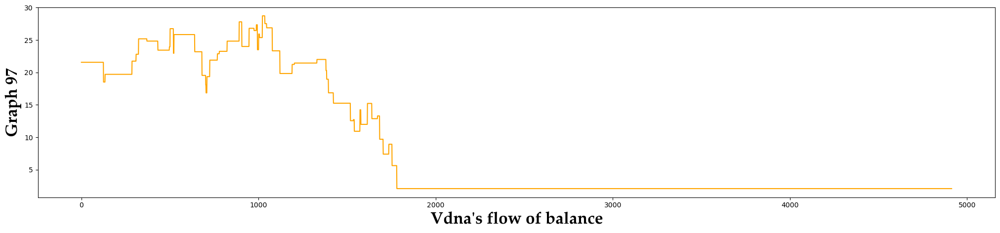

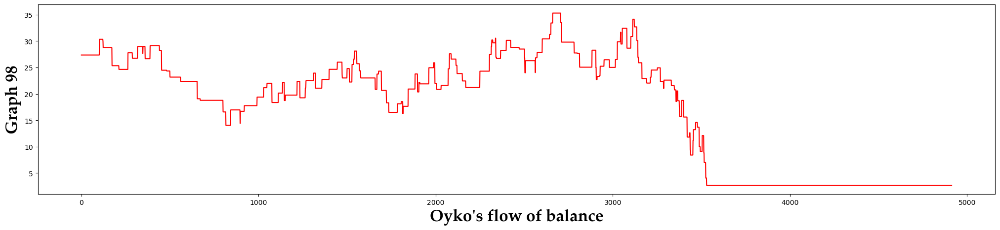

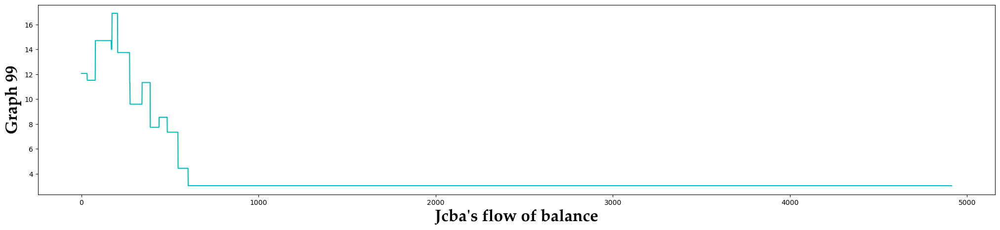

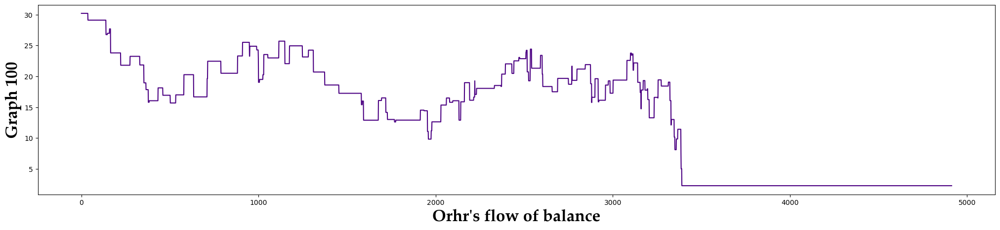

In [8]:
for i in range(number_of_players_in_pool):
    plt.figure(figsize=(25,5))
    matches_df.iloc[:,12+i].plot(kind='line', color= random.choice(['r','g','b','c','black','indigo','orange']))
    plt.xlabel(f"{col_names[12+i]}'s flow of balance", fontdict=font)
    plt.ylabel(f"Graph {i+1}", fontdict=font)
    plt.show()
    i += 1

Text(0, 0.5, 'Count')

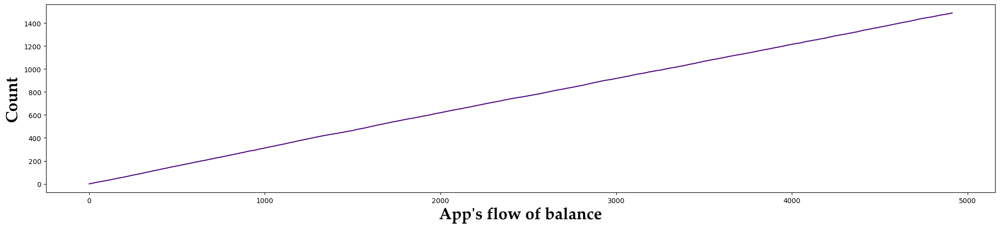

In [9]:
plt.figure(figsize=(25,5))
matches_df['Total Amount Earned by App'].plot(kind='line', color='indigo')
plt.xlabel("App's flow of balance", fontdict=font)
plt.ylabel("Count", fontdict=font)

### Linear Regression model preparation

In [10]:
predictor = matches_df.drop('Total Amount Earned by App', axis=1)

In [11]:
predictor

,Match Number,Player 1,Player 2,Loser,Winner,Points Lost by Loser,Amount Lost by Loser,Amount Remaining for Loser,Amount to be Credited to App,Amount Won by Winner,...,Gpoo,Ltlx,Oecc,Zksm,Ibhy,Yatc,Vdna,Oyko,Jcba,Orhr
0,1,Fvxp,Bcth,Bcth,Fvxp,4,0.20,12.420,0.030,0.170,...,14.688,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219
1,2,Xgfu,Yzys,Xgfu,Yzys,2,0.10,6.486,0.015,0.085,...,14.688,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219
2,3,Wncu,Xhop,Xhop,Wncu,76,3.80,15.727,0.570,3.230,...,14.688,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219
3,4,Wncu,Pvmp,Pvmp,Wncu,60,3.00,19.318,0.450,2.550,...,14.688,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219
4,5,Flzk,Lsmf,Lsmf,Flzk,22,1.10,26.390,0.165,0.935,...,14.688,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4909,4910,Nxhj,Ltlx,Ltlx,Nxhj,28,1.40,9.529,0.210,1.190,...,2.634,10.929,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277
4910,4911,Nxhj,Ltlx,Nxhj,Ltlx,23,1.15,67.966,0.172,0.978,...,2.634,9.529,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277
4911,4912,Ltlx,Nxhj,Ltlx,Nxhj,54,2.70,7.807,0.405,2.295,...,2.634,10.507,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277
4912,4913,Nxhj,Ltlx,Ltlx,Nxhj,69,3.45,4.357,0.517,2.933,...,2.634,7.807,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277


In [12]:
target = pd.DataFrame(matches_df['Total Amount Earned by App'])
target

,Total Amount Earned by App
0,0.030
1,0.045
2,0.615
3,1.065
4,1.230
...,...
4909,1486.084
4910,1486.256
4911,1486.661
4912,1487.178


In [13]:
cat_cols = [col for col in predictor.columns.values if predictor[col].dtype == 'object']
predictor_cat = predictor[cat_cols]
predictor_cat

,Player 1,Player 2,Loser,Winner
0,Fvxp,Bcth,Bcth,Fvxp
1,Xgfu,Yzys,Xgfu,Yzys
2,Wncu,Xhop,Xhop,Wncu
3,Wncu,Pvmp,Pvmp,Wncu
4,Flzk,Lsmf,Lsmf,Flzk
...,...,...,...,...
4909,Nxhj,Ltlx,Ltlx,Nxhj
4910,Nxhj,Ltlx,Nxhj,Ltlx
4911,Ltlx,Nxhj,Ltlx,Nxhj
4912,Nxhj,Ltlx,Ltlx,Nxhj


In [14]:
cat_dummy = pd.get_dummies(predictor_cat, drop_first=True)
cat_dummy

,Player 1_Ahdu,Player 1_Akwu,Player 1_Bcth,Player 1_Bjkw,Player 1_Bqyu,Player 1_Btfj,Player 1_Cefj,Player 1_Ckws,Player 1_Crla,Player 1_Djjd,...,Winner_Yatc,Winner_Yocc,Winner_Yylr,Winner_Yznb,Winner_Yzys,Winner_Zekw,Winner_Zksm,Winner_Zttd,Winner_Zwue,Winner_Zyco
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4909,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4910,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4911,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4912,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [15]:
predictor_num = predictor.drop(cat_cols, axis=1)
predictor_num

,Match Number,Points Lost by Loser,Amount Lost by Loser,Amount Remaining for Loser,Amount to be Credited to App,Amount Won by Winner,Amount Remaining for Winner,Xhop,Bqyu,Rlqi,...,Gpoo,Ltlx,Oecc,Zksm,Ibhy,Yatc,Vdna,Oyko,Jcba,Orhr
0,1,4,0.20,12.420,0.030,0.170,23.823,19.527,11.095,12.747,...,14.688,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219
1,2,2,0.10,6.486,0.015,0.085,25.131,19.527,11.095,12.747,...,14.688,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219
2,3,76,3.80,15.727,0.570,3.230,14.612,19.527,11.095,12.747,...,14.688,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219
3,4,60,3.00,19.318,0.450,2.550,17.162,15.727,11.095,12.747,...,14.688,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219
4,5,22,1.10,26.390,0.165,0.935,31.001,15.727,11.095,12.747,...,14.688,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4909,4910,28,1.40,9.529,0.210,1.190,69.116,3.213,3.247,3.804,...,2.634,10.929,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277
4910,4911,23,1.15,67.966,0.172,0.978,10.507,3.213,3.247,3.804,...,2.634,9.529,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277
4911,4912,54,2.70,7.807,0.405,2.295,70.261,3.213,3.247,3.804,...,2.634,10.507,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277
4912,4913,69,3.45,4.357,0.517,2.933,73.194,3.213,3.247,3.804,...,2.634,7.807,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277


In [16]:
predictor_num['Match Number'] = predictor_num['Match Number'].astype('float64')
predictor_num['Points Lost by Loser'] = predictor_num['Points Lost by Loser'].astype('float64')

### Logarithmic Transformation to convert the target's unifrom distribution to a normal distribution

In [17]:
import numpy as np

target_log = np.log1p(target)

In [18]:
target_log

,Total Amount Earned by App
0,0.029559
1,0.044017
2,0.479335
3,0.725130
4,0.802002
...,...
4909,7.304572
4910,7.304688
4911,7.304960
4912,7.305308


<Axes: ylabel='Count'>

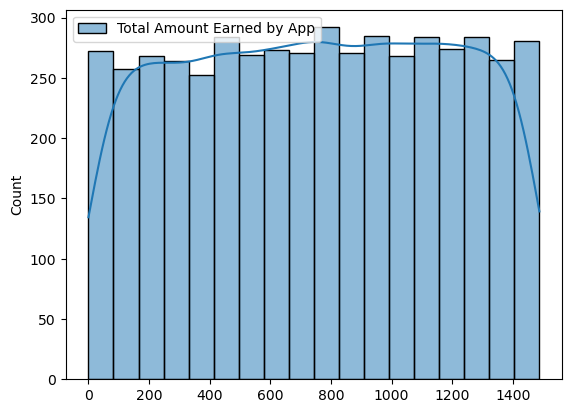

In [19]:
sns.histplot(target, kde=True)

<Axes: ylabel='Count'>

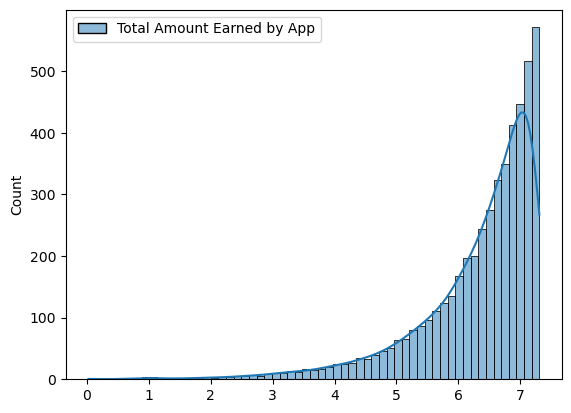

In [20]:
sns.histplot(target_log, kde=True)

In [21]:
cat_dummy.columns

Index(['Player 1_Ahdu', 'Player 1_Akwu', 'Player 1_Bcth', 'Player 1_Bjkw',
       'Player 1_Bqyu', 'Player 1_Btfj', 'Player 1_Cefj', 'Player 1_Ckws',
       'Player 1_Crla', 'Player 1_Djjd',
       ...
       'Winner_Yatc', 'Winner_Yocc', 'Winner_Yylr', 'Winner_Yznb',
       'Winner_Yzys', 'Winner_Zekw', 'Winner_Zksm', 'Winner_Zttd',
       'Winner_Zwue', 'Winner_Zyco'],
      dtype='object', length=383)

In [22]:
predictor_new = pd.concat([cat_dummy, predictor_num], axis =1)
predictor_new

,Player 1_Ahdu,Player 1_Akwu,Player 1_Bcth,Player 1_Bjkw,Player 1_Bqyu,Player 1_Btfj,Player 1_Cefj,Player 1_Ckws,Player 1_Crla,Player 1_Djjd,...,Gpoo,Ltlx,Oecc,Zksm,Ibhy,Yatc,Vdna,Oyko,Jcba,Orhr
0,0,0,0,0,0,0,0,0,0,0,...,14.688,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219
1,0,0,0,0,0,0,0,0,0,0,...,14.688,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219
2,0,0,0,0,0,0,0,0,0,0,...,14.688,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219
3,0,0,0,0,0,0,0,0,0,0,...,14.688,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219
4,0,0,0,0,0,0,0,0,0,0,...,14.688,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4909,0,0,0,0,0,0,0,0,0,0,...,2.634,10.929,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277
4910,0,0,0,0,0,0,0,0,0,0,...,2.634,9.529,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277
4911,0,0,0,0,0,0,0,0,0,0,...,2.634,10.507,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277
4912,0,0,0,0,0,0,0,0,0,0,...,2.634,7.807,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277


In [23]:
from sklearn.model_selection import train_test_split

X_train, x_test, Y_train, y_test = train_test_split(predictor_new.astype(float), target_log.astype(float), test_size=0.3, random_state=2024)

In [24]:
X_train.shape

(3439, 490)

In [25]:
x_test.shape

(1475, 490)

In [26]:
Y_train.shape

(3439, 1)

In [27]:
y_test.shape

(1475, 1)

In [28]:
from sklearn.linear_model import LinearRegression

lin = LinearRegression()

model = lin.fit(X_train, Y_train)

In [29]:
import statsmodels.api as sm

#X_train = sm.add_constant(X_train)

model = sm.OLS(Y_train, X_train).fit()

In [30]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     OLS Regression Results                                    
===============================================================================================
Dep. Variable:     Total Amount Earned by App   R-squared (uncentered):                   1.000
Model:                                    OLS   Adj. R-squared (uncentered):              1.000
Method:                         Least Squares   F-statistic:                          2.033e+06
Date:                        Fri, 17 May 2024   Prob (F-statistic):                        0.00
Time:                                07:30:33   Log-Likelihood:                          10147.
No. Observations:                        3439   AIC:                                 -1.953e+04
Df Residuals:                            3055   BIC:                                 -1.717e+04
Df Model:                                 384                                                  
Covariance Type:                    nonrobust                                                  
================================================================================================
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Player 1_Ahdu                -6.413e-12   6.34e-12     -1.012      0.312   -1.88e-11    6.02e-12
Player 1_Akwu                    0.0053      0.004      1.274      0.203      -0.003       0.014
Player 1_Bcth                    0.0072      0.012      0.620      0.536      -0.016       0.030
Player 1_Bjkw                    0.0112      0.010      1.069      0.285      -0.009       0.032
Player 1_Bqyu                    0.0017      0.004      0.478      0.633      -0.005       0.009
Player 1_Btfj                    0.0091      0.005      1.979      0.048    8.52e-05       0.018
Player 1_Cefj                    0.0406      0.008      4.858      0.000       0.024       0.057
Player 1_Ckws                    0.0042      0.004      1.051      0.293      -0.004       0.012
Player 1_Crla                    0.0021      0.004      0.593      0.553      -0.005       0.009
Player 1_Djjd                   -0.0037      0.005     -0.775      0.438      -0.013       0.006
Player 1_Dyiv                    0.0165      0.008      2.059      0.040       0.001       0.032
Player 1_Ejtj                    0.0133      0.004      3.109      0.002       0.005       0.022
Player 1_Etfu                    0.0077      0.004      1.878      0.060      -0.000       0.016
Player 1_File                    0.0047      0.004      1.291      0.197      -0.002       0.012
Player 1_Flzk                   -0.0006      0.004     -0.154      0.877      -0.008       0.007
Player 1_Fqnv                    0.0031      0.004      0.856      0.392      -0.004       0.010
Player 1_Fudy                    0.0009      0.004      0.231      0.817      -0.007       0.008
Player 1_Fvxp                    0.0017      0.003      0.497      0.619      -0.005       0.008
Player 1_Fzvj                    0.0872      0.013      6.729      0.000       0.062       0.113
Player 1_Gpoo                    0.0209      0.009      2.441      0.015       0.004       0.038
Player 1_Gtyh                    0.0027      0.004      0.728      0.467      -0.005       0.010
Player 1_Guub                    0.0116      0.007      1.570      0.117      -0.003       0.026
Player 1_Hdys                    0.0025      0.003      0.758      0.448      -0.004       0.009
Player 1_Hgjs                    0.0020      0.004      0.534      0.593      -0.005       0.009
Player 1_Ibhy                    0.0021      0.003      0.620      0.535      -0.005       0.009
Player 1_Ifbf                    0.0024      0.003      0.710      0.478      -0.004       0.009
Player 1_Ihqz                    0.0081      0.004      1.895      0.058      -0.00

In [31]:
y_pred = model.predict(x_test)

In [32]:
y_pred

4632    7.248429
4370    7.194784
1805    6.322494
2933    6.803740
4490    7.223375
          ...   
3881    7.072723
1383    6.074557
9       0.913920
3110    6.858577
190     4.021870
Length: 1475, dtype: float64

In [33]:
pd.set_option('display.max_rows',150)

In [34]:
matches_df.isnull().sum().head(112)

Match Number                    0
Player 1                        0
Player 2                        0
Loser                           0
Winner                          0
Points Lost by Loser            0
Amount Lost by Loser            0
Amount Remaining for Loser      0
Amount to be Credited to App    0
Total Amount Earned by App      0
Amount Won by Winner            0
Amount Remaining for Winner     0
Xhop                            0
Bqyu                            0
Rlqi                            0
Nxhj                            0
Xgfu                            0
Ifbf                            0
Scqu                            0
Imuo                            0
Zttd                            0
Unym                            0
Kwzf                            0
Pysd                            0
Lsmf                            0
Fudy                            0
Yzys                            0
Uqky                            0
Qcgd                            0
Tdqg          

In [35]:
new = pd.concat([predictor_num,target], axis=1)

In [36]:
new

,Match Number,Points Lost by Loser,Amount Lost by Loser,Amount Remaining for Loser,Amount to be Credited to App,Amount Won by Winner,Amount Remaining for Winner,Xhop,Bqyu,Rlqi,...,Ltlx,Oecc,Zksm,Ibhy,Yatc,Vdna,Oyko,Jcba,Orhr,Total Amount Earned by App
0,1.0,4.0,0.20,12.420,0.030,0.170,23.823,19.527,11.095,12.747,...,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219,0.030
1,2.0,2.0,0.10,6.486,0.015,0.085,25.131,19.527,11.095,12.747,...,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219,0.045
2,3.0,76.0,3.80,15.727,0.570,3.230,14.612,19.527,11.095,12.747,...,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219,0.615
3,4.0,60.0,3.00,19.318,0.450,2.550,17.162,15.727,11.095,12.747,...,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219,1.065
4,5.0,22.0,1.10,26.390,0.165,0.935,31.001,15.727,11.095,12.747,...,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219,1.230
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4909,4910.0,28.0,1.40,9.529,0.210,1.190,69.116,3.213,3.247,3.804,...,10.929,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277,1486.084
4910,4911.0,23.0,1.15,67.966,0.172,0.978,10.507,3.213,3.247,3.804,...,9.529,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277,1486.256
4911,4912.0,54.0,2.70,7.807,0.405,2.295,70.261,3.213,3.247,3.804,...,10.507,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277,1486.661
4912,4913.0,69.0,3.45,4.357,0.517,2.933,73.194,3.213,3.247,3.804,...,7.807,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277,1487.178


In [37]:
new.columns

Index(['Match Number', 'Points Lost by Loser', 'Amount Lost by Loser',
       'Amount Remaining for Loser', 'Amount to be Credited to App',
       'Amount Won by Winner', 'Amount Remaining for Winner', 'Xhop', 'Bqyu',
       'Rlqi',
       ...
       'Ltlx', 'Oecc', 'Zksm', 'Ibhy', 'Yatc', 'Vdna', 'Oyko', 'Jcba', 'Orhr',
       'Total Amount Earned by App'],
      dtype='object', length=108)

In [38]:
new_1 = new.iloc[:,7:]

In [39]:
new_1

,Xhop,Bqyu,Rlqi,Nxhj,Xgfu,Ifbf,Scqu,Imuo,Zttd,Unym,...,Ltlx,Oecc,Zksm,Ibhy,Yatc,Vdna,Oyko,Jcba,Orhr,Total Amount Earned by App
0,19.527,11.095,12.747,30.822,6.586,26.671,26.944,15.091,13.849,17.301,...,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219,0.030
1,19.527,11.095,12.747,30.822,6.586,26.671,26.944,15.091,13.849,17.301,...,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219,0.045
2,19.527,11.095,12.747,30.822,6.486,26.671,26.944,15.091,13.849,17.301,...,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219,0.615
3,15.727,11.095,12.747,30.822,6.486,26.671,26.944,15.091,13.849,17.301,...,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219,1.065
4,15.727,11.095,12.747,30.822,6.486,26.671,26.944,15.091,13.849,17.301,...,11.180,23.074,22.235,21.514,27.623,21.565,27.366,12.067,30.219,1.230
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4909,3.213,3.247,3.804,67.926,2.901,3.635,3.739,1.794,2.061,3.990,...,10.929,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277,1486.084
4910,3.213,3.247,3.804,69.116,2.901,3.635,3.739,1.794,2.061,3.990,...,9.529,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277,1486.256
4911,3.213,3.247,3.804,67.966,2.901,3.635,3.739,1.794,2.061,3.990,...,10.507,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277,1486.661
4912,3.213,3.247,3.804,70.261,2.901,3.635,3.739,1.794,2.061,3.990,...,7.807,1.132,3.652,2.461,3.496,2.071,2.654,3.046,2.277,1487.178


In [40]:
for col in new_1.columns.values:
    new_1[f'{col} loss'] = new_1[col].diff()

C:\Users\Admin\AppData\Local\Temp\ipykernel_11568\3616568369.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  new_1[f'{col} loss'] = new_1[col].diff()
C:\Users\Admin\AppData\Local\Temp\ipykernel_11568\3616568369.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  new_1[f'{col} loss'] = new_1[col].diff()
C:\Users\Admin\AppData\Local\Temp\ipykernel_11568\3616568369.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joi

In [41]:
new_1

,Xhop,Bqyu,Rlqi,Nxhj,Xgfu,Ifbf,Scqu,Imuo,Zttd,Unym,...,Ltlx loss,Oecc loss,Zksm loss,Ibhy loss,Yatc loss,Vdna loss,Oyko loss,Jcba loss,Orhr loss,Total Amount Earned by App loss
0,19.527,11.095,12.747,30.822,6.586,26.671,26.944,15.091,13.849,17.301,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,19.527,11.095,12.747,30.822,6.586,26.671,26.944,15.091,13.849,17.301,...,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.015
2,19.527,11.095,12.747,30.822,6.486,26.671,26.944,15.091,13.849,17.301,...,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.570
3,15.727,11.095,12.747,30.822,6.486,26.671,26.944,15.091,13.849,17.301,...,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.450
4,15.727,11.095,12.747,30.822,6.486,26.671,26.944,15.091,13.849,17.301,...,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.165
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4909,3.213,3.247,3.804,67.926,2.901,3.635,3.739,1.794,2.061,3.990,...,1.275,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.210
4910,3.213,3.247,3.804,69.116,2.901,3.635,3.739,1.794,2.061,3.990,...,-1.400,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.172
4911,3.213,3.247,3.804,67.966,2.901,3.635,3.739,1.794,2.061,3.990,...,0.978,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.405
4912,3.213,3.247,3.804,70.261,2.901,3.635,3.739,1.794,2.061,3.990,...,-2.700,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.517


#### Handling missing values

In [42]:
new_1.isnull().sum()

Xhop                               0
Bqyu                               0
Rlqi                               0
Nxhj                               0
Xgfu                               0
                                  ..
Vdna loss                          1
Oyko loss                          1
Jcba loss                          1
Orhr loss                          1
Total Amount Earned by App loss    1
Length: 202, dtype: int64

In [43]:
new_1[new_1.columns[4:]] = new_1[new_1.columns[4:]].fillna(0)

In [44]:
new_1

,Xhop,Bqyu,Rlqi,Nxhj,Xgfu,Ifbf,Scqu,Imuo,Zttd,Unym,...,Ltlx loss,Oecc loss,Zksm loss,Ibhy loss,Yatc loss,Vdna loss,Oyko loss,Jcba loss,Orhr loss,Total Amount Earned by App loss
0,19.527,11.095,12.747,30.822,6.586,26.671,26.944,15.091,13.849,17.301,...,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000
1,19.527,11.095,12.747,30.822,6.586,26.671,26.944,15.091,13.849,17.301,...,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.015
2,19.527,11.095,12.747,30.822,6.486,26.671,26.944,15.091,13.849,17.301,...,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.570
3,15.727,11.095,12.747,30.822,6.486,26.671,26.944,15.091,13.849,17.301,...,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.450
4,15.727,11.095,12.747,30.822,6.486,26.671,26.944,15.091,13.849,17.301,...,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.165
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4909,3.213,3.247,3.804,67.926,2.901,3.635,3.739,1.794,2.061,3.990,...,1.275,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.210
4910,3.213,3.247,3.804,69.116,2.901,3.635,3.739,1.794,2.061,3.990,...,-1.400,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.172
4911,3.213,3.247,3.804,67.966,2.901,3.635,3.739,1.794,2.061,3.990,...,0.978,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.405
4912,3.213,3.247,3.804,70.261,2.901,3.635,3.739,1.794,2.061,3.990,...,-2.700,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.517


In [45]:
# plt.figure(figsize=(10,5))
# sns.heatmap(new_1.corr(), annot=True, cmap='coolwarm')

#Uncomment the above code and run it only when the number of players are small i.e 10 and below as it would take a long time to generate and a heatmap is not a good idea when having large number of variables/features in the dataset

In [46]:
new = new.drop(['Match Number', 'Points Lost by Loser', 'Amount Lost by Loser','Amount Remaining for Loser', 'Amount Won by Winner', 'Amount Remaining for Winner'], axis=1)

In [47]:
# plt.figure(figsize=(15,10))
# sns.heatmap(new.corr(numeric_only=True), annot=True, fmt='0.2g', cmap='viridis', cbar=True, square=True)

#Uncomment the above code and run it only when the number of players are small i.e 10 and below

Text(0, 0.5, 'App')

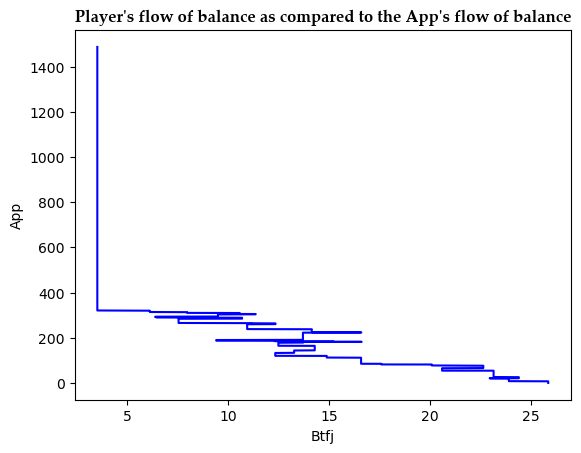

In [48]:
font1 = {'size':12, 'family':'Palatino Linotype', 'weight':'bold'}
matches_df.plot(x=random.choice(matches_df.columns.values[12:]), legend=False, y='Total Amount Earned by App', kind='line',  color=random.choice(['r','g','b','yellow','black','orange','indigo']))
plt.title("Player's flow of balance as compared to the App's flow of balance", fontdict=font1)
plt.ylabel("App")

#Change value from 12 to any greater int value within the length of columns.values to get similar visualizations for other players

In [49]:
df = pd.read_csv(r"D:\DSP and ML files\CSV\Rummy 4 Player 0.5.csv")
#Save the csv file in local storage and access it in the above code

In [50]:
df.head()

,Match Number,Total Amount Earned by App,Losing Players Balance 1,Losing Players Balance 2,Losing Players Balance 3,Winning Player Balance,Amount to be Credited to App
0,86,29.642,5.412,3.554,2.172,21.407,0.570
1,96,30.625,5.921,1.342,3.706,37.562,0.360
2,193,59.883,3.507,2.485,1.424,31.038,0.382
3,145,42.600,2.030,2.736,6.647,38.266,0.412
4,190,59.261,3.930,5.232,5.442,19.106,0.495


In [51]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Match Number,55.0,112.272727,50.046443,16.000,74.0000,111.000,152.5000,207.000
Total Amount Earned by App,55.0,34.199164,15.055405,4.905,22.7765,35.084,44.3080,65.040
Losing Players Balance 1,55.0,4.013018,1.590804,0.562,2.9155,3.635,5.2255,7.308
Losing Players Balance 2,55.0,3.768982,1.842975,0.851,2.4505,3.554,4.7860,7.626
Losing Players Balance 3,55.0,3.514891,1.703922,0.597,2.1755,3.487,4.4580,7.487
Winning Player Balance,55.0,33.897400,9.613877,18.697,26.1080,34.789,39.0185,65.902
Amount to be Credited to App,55.0,0.404364,0.146301,0.022,0.2960,0.412,0.5470,0.593


<Axes: >

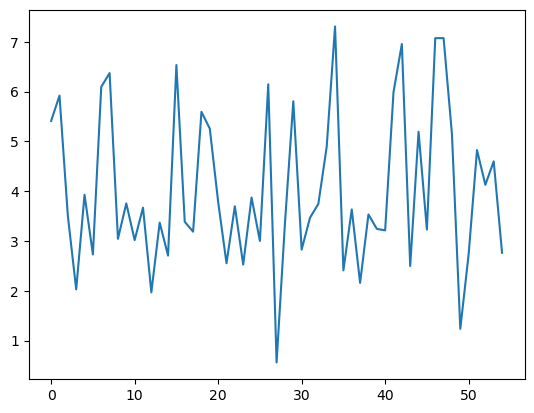

In [52]:
df['Losing Players Balance 1'].plot(kind='line')

In [53]:
df['Total Money Involved in each pool'] = df[['Losing Players Balance 1', 'Losing Players Balance 2', 'Losing Players Balance 3', 'Winning Player Balance', 'Total Amount Earned by App']].sum(axis=1)

In [54]:
df.head()

,Match Number,Total Amount Earned by App,Losing Players Balance 1,Losing Players Balance 2,Losing Players Balance 3,Winning Player Balance,Amount to be Credited to App,Total Money Involved in each pool
0,86,29.642,5.412,3.554,2.172,21.407,0.570,62.187
1,96,30.625,5.921,1.342,3.706,37.562,0.360,79.156
2,193,59.883,3.507,2.485,1.424,31.038,0.382,98.337
3,145,42.600,2.030,2.736,6.647,38.266,0.412,92.279
4,190,59.261,3.930,5.232,5.442,19.106,0.495,92.971


C:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


(<seaborn.axisgrid.FacetGrid at 0x2874f325fd0>,
 <seaborn.axisgrid.FacetGrid at 0x2874e1d7ad0>)

<Figure size 500x500 with 0 Axes>

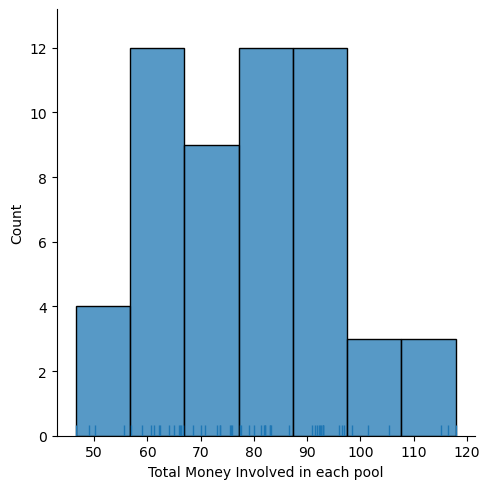

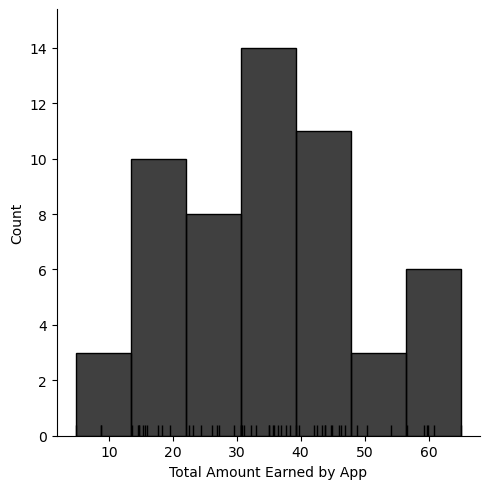

In [55]:
plt.figure(figsize=(5,5))

sns.displot(data=df, x='Total Money Involved in each pool',rug=True), sns.displot(data=df, x='Total Amount Earned by App', color='black', rug=True)

In [56]:
%store matches_df

Stored 'matches_df' (DataFrame)


In [57]:
%store number_of_players_in_pool

Stored 'number_of_players_in_pool' (int)


In [58]:
%store totalPlayers

Stored 'totalPlayers' (dict)


In [59]:
players = list(totalPlayers.keys())
players.append('Total Amount Earned by App')

In [60]:
players

['Xhop',
 'Bqyu',
 'Rlqi',
 'Nxhj',
 'Xgfu',
 'Ifbf',
 'Scqu',
 'Imuo',
 'Zttd',
 'Unym',
 'Kwzf',
 'Pysd',
 'Lsmf',
 'Fudy',
 'Yzys',
 'Uqky',
 'Qcgd',
 'Tdqg',
 'Ckws',
 'Nxnn',
 'Cefj',
 'Jylf',
 'Ejtj',
 'Guub',
 'Opya',
 'Flzk',
 'Crla',
 'Akwu',
 'Gtyh',
 'Wncu',
 'Ihqz',
 'Yznb',
 'Xezp',
 'Ppgu',
 'Etfu',
 'Vziz',
 'Rzor',
 'Xbrh',
 'Zwue',
 'Zyco',
 'Tflb',
 'Adnr',
 'Hdys',
 'Nfpv',
 'Npwb',
 'Ivqs',
 'Uvpe',
 'Uxem',
 'Fzvj',
 'Mwpw',
 'Yocc',
 'Lrkh',
 'Hgjs',
 'Sifo',
 'Pupz',
 'Qmke',
 'Mviv',
 'Fqnv',
 'Jafa',
 'Tujn',
 'Vvvi',
 'Yylr',
 'Pvmp',
 'Tbhl',
 'Vcal',
 'Ahdu',
 'Oyyj',
 'Tezb',
 'Bcth',
 'Tvcj',
 'Btfj',
 'Fvxp',
 'Zekw',
 'Iiqi',
 'Caqs',
 'Wcgi',
 'Zsnn',
 'Mmyu',
 'Piez',
 'Oksh',
 'Npqv',
 'Bjkw',
 'Djjd',
 'Ovjb',
 'Dyiv',
 'Uask',
 'File',
 'Kxzn',
 'Svjd',
 'Kqgt',
 'Gpoo',
 'Ltlx',
 'Oecc',
 'Zksm',
 'Ibhy',
 'Yatc',
 'Vdna',
 'Oyko',
 'Jcba',
 'Orhr',
 'Total Amount Earned by App']